In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [ ]:
%%time
identity=pd.read_csv("train_identity.csv")
transaction=pd.read_csv("train_transaction.csv")

In [ ]:
print("Shape of train_identity.csv",identity.shape)
print("Shape of train_transaction.csv",transaction.shape)

In [ ]:
identity.columns[identity.isnull().any()]

In [ ]:
identity.isnull().sum().sort_values(ascending=False).head()

In [ ]:
transaction.columns[transaction.isnull().any()]

In [ ]:
transaction.isnull().sum().sort_values(ascending=False).head()

In [ ]:
identity.TransactionID.nunique()

In [ ]:
transaction.TransactionID.nunique()

In [ ]:
identity.columns[identity.isnull().any()]#39 columns has null values

In [ ]:
#Number of null values in each column
null_identity_frame=identity.isnull().sum().to_frame().T

In [12]:
#Removing columns with more than 50% of missing values
drop_columns=[]
for col in null_identity_frame.columns:
    if(null_identity_frame.loc[0,col]==0):
        continue
    elif((null_identity_frame.loc[0,col]*100/identity.shape[0])>70):
        drop_columns.append(col)
    else:
        continue
       # print(f'columns {col} has {round(null_identity_frame.loc[0,col]*100/identity.shape[0])}% of null values')

In [13]:
identity.drop(columns=drop_columns,inplace=True)

In [14]:
identity.shape

(144233, 32)

In [15]:
identity.id_01.describe()

count    144233.000000
mean        -10.170502
std          14.347949
min        -100.000000
25%         -10.000000
50%          -5.000000
75%          -5.000000
max           0.000000
Name: id_01, dtype: float64

In [16]:
df=transaction.merge(identity,copy=True,how="left",on="TransactionID")

In [17]:
print("Dataset has {} rows".format(df.shape[0]))
print("Dataset has {} columns".format(df.shape[1]))

Dataset has 590540 rows
Dataset has 425 columns


In [18]:
print("Total {} columns has null values".format(len(df.columns[df.isnull().any()])))

Total 405 columns has null values


In [19]:
%%time
drop_columns=[]
for col in df.columns:
    if(round((df[col].isnull().sum()*100)/df.shape[0])>=50):
        drop_columns.append(col)
    else:
        
        continue

Wall time: 6.43 s


In [20]:
print("Total {} columns has more than 50% of missing values".format(len(drop_columns)))

Total 205 columns has more than 50% of missing values


In [21]:
#Dropping columns with more than 50% of missing values
df.drop(columns=drop_columns,inplace=True)

In [22]:
categorical_columns=df.select_dtypes(include="object").columns.tolist()

# Treating missing categorical values

In [23]:
%%time
for col in categorical_columns:
    if(df[col].isnull().sum()>=0 and df[col].isnull().sum()<10000):
        df.dropna(subset=[col],inplace=True)
        print(f'Dropping rows for null values in column {col}')
    else:
        print(f'Column {col} has {df[col].isnull().sum()} null values and {df[col].nunique()} unique value')

Dropping rows for null values in column ProductCD
Dropping rows for null values in column card4
Dropping rows for null values in column card6
Column P_emaildomain has 94227 null values and 59 unique value
Column M1 has 270736 null values and 2 unique value
Column M2 has 270736 null values and 2 unique value
Column M3 has 270736 null values and 2 unique value
Column M4 has 280739 null values and 3 unique value
Column M6 has 169098 null values and 2 unique value
Wall time: 4.88 s


In [24]:
df.M1.value_counts()#.plot(kind="bar")

T    318196
F        25
Name: M1, dtype: int64

In [25]:
df.drop(columns=["M1"],inplace=True)#M1 has low variance

In [26]:
df.drop(columns=["M2","M3","M4","M6"],inplace=True)

In [27]:
from math import floor

In [28]:
df["days"]=df["TransactionDT"]

In [29]:
df["days"]=df.days.map(lambda x: floor(x/(3600*24)))

In [30]:
numerical_columns=df.select_dtypes(exclude="object").columns.tolist()

In [31]:
df.shape

(588957, 216)

In [32]:
%%time
for col in numerical_columns:
    if col in ["TransactionID","isFraud"]:
        continue
    elif(df[col].isnull().sum()>=0 and df[col].isnull().sum()<10000):
        df.dropna(subset=[col],inplace=True)
        #print(f'Dropping rows for null values in column {col}')
    else:
        print(f'Column {col} has {df[col].isnull().sum()} null values and {df[col].nunique()} unique value')

Column addr1 has 64850 null values and 329 unique value
Column addr2 has 64850 null values and 73 unique value
Column D2 has 273604 null values and 641 unique value
Column D3 has 256379 null values and 649 unique value
Column D4 has 165797 null values and 805 unique value
Column D10 has 75036 null values and 818 unique value
Column D11 has 273977 null values and 675 unique value
Column D15 has 87669 null values and 858 unique value
Column V1 has 273977 null values and 2 unique value
Column V2 has 273977 null values and 9 unique value
Column V3 has 273977 null values and 10 unique value
Column V4 has 273977 null values and 7 unique value
Column V5 has 273977 null values and 7 unique value
Column V6 has 273977 null values and 10 unique value
Column V7 has 273977 null values and 10 unique value
Column V8 has 273977 null values and 9 unique value
Column V9 has 273977 null values and 9 unique value
Column V10 has 273977 null values and 5 unique value
Column V11 has 273977 null values and 6 

In [33]:
df.shape

(578081, 216)

In [34]:
len(df.columns[df.isnull().any()])

103

In [35]:
null_columns=df.columns[df.isnull().any()].tolist()

C:\Users\gandh\Anaconda3\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


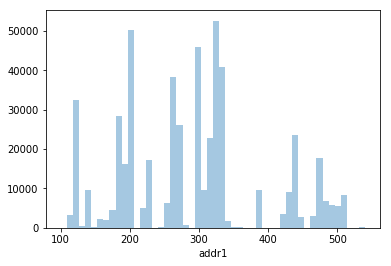

In [36]:
sns.distplot(df[df[null_columns[0]].notnull()][null_columns[0]],kde=False)

C:\Users\gandh\Anaconda3\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


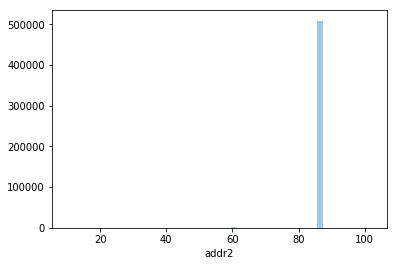

In [37]:
sns.distplot(df[df[null_columns[1]].notnull()][null_columns[1]],kde=False)

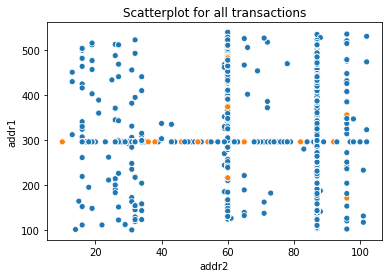

In [38]:
sns.scatterplot(x="addr2",y="addr1",data=df,hue="isFraud",legend=False)
plt.title("Scatterplot for all transactions")
plt.show()

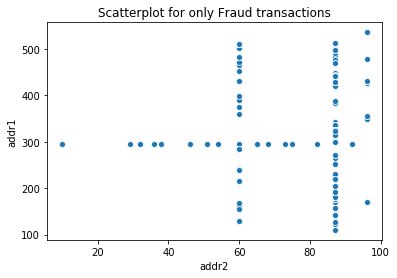

In [39]:
sns.scatterplot(x="addr2",y="addr1",data=df[df.isFraud==1],legend=False)
plt.title("Scatterplot for only Fraud transactions")
plt.show()

In [40]:
df.addr2.value_counts().sort_values(ascending=False).head()

87.0    509169
60.0      3025
96.0       635
32.0        91
65.0        82
Name: addr2, dtype: int64

In [41]:
df.shape

(578081, 216)

In [42]:
df.dropna(subset=["addr1","addr2"],inplace=True)

In [43]:
df.shape

(513445, 216)

In [44]:
null_columns=df.columns[df.isnull().any()].tolist()

In [45]:
df.dropna(subset=["V94"],inplace=True)#Most of the features with V has similar number of null values

In [46]:
df.dropna(subset=["V34"],inplace=True)

In [47]:
df.dropna(subset=["V53"],inplace=True)

In [48]:
df.dropna(subset=["P_emaildomain"],inplace=True)

In [49]:
df.dropna(subset=["V52"],inplace=True)

In [50]:
null_columns=df.columns[df.isnull().any()].tolist()

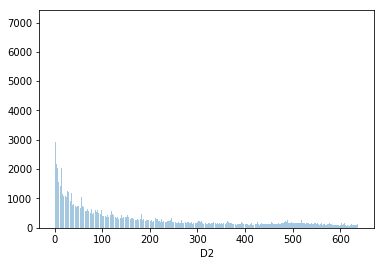

In [51]:
sns.distplot(df[df.D2.notnull()]["D2"],kde=False,bins=700)

In [52]:
df.D2.fillna(df.D2.median(),inplace=True)

In [53]:
for col in null_columns:
    print(f'Column {col} has {df[col].isnull().sum()} null values')

Column D2 has 0 null values
Column D3 has 118500 null values
Column D11 has 97255 null values
Column V1 has 97255 null values
Column V2 has 97255 null values
Column V3 has 97255 null values
Column V4 has 97255 null values
Column V5 has 97255 null values
Column V6 has 97255 null values
Column V7 has 97255 null values
Column V8 has 97255 null values
Column V9 has 97255 null values
Column V10 has 97255 null values
Column V11 has 97255 null values


C:\Users\gandh\Anaconda3\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


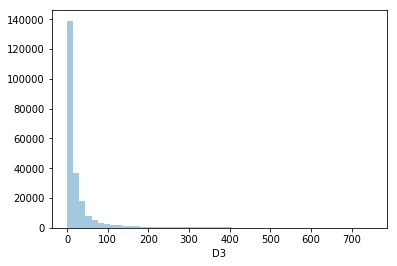

In [54]:
sns.distplot(df[df.D3.notnull()]["D3"],kde=False)

In [55]:
df.D3.fillna(df.D3.median(),inplace=True)

In [56]:
df.dropna(subset=["V11"],inplace=True)

In [57]:
df.shape

(248398, 216)

In [58]:
low_variance_columns=[]
for col in df.columns:
    if(df[col].nunique()==1):
        low_variance_columns.append(col)
    else:
        continue

In [59]:
df.drop(columns=low_variance_columns,inplace=True)

In [60]:
df.shape

(248398, 173)

In [61]:
numerical_columns=df.select_dtypes(exclude="object").columns.tolist()

# We may have to perform oversampling since the target variable is highly imbalanced

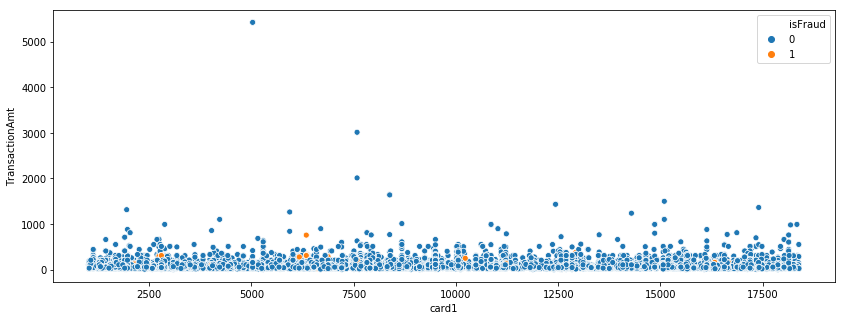

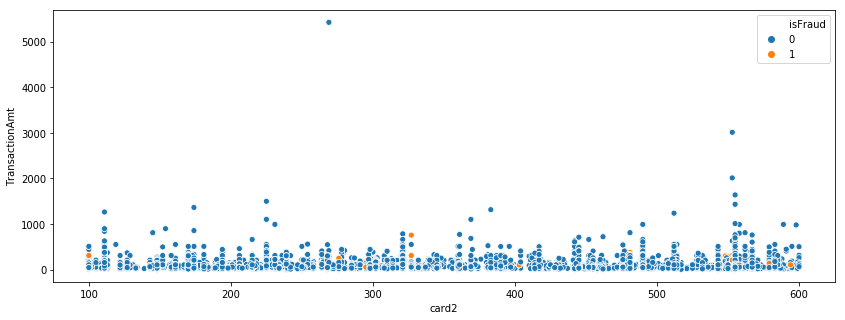

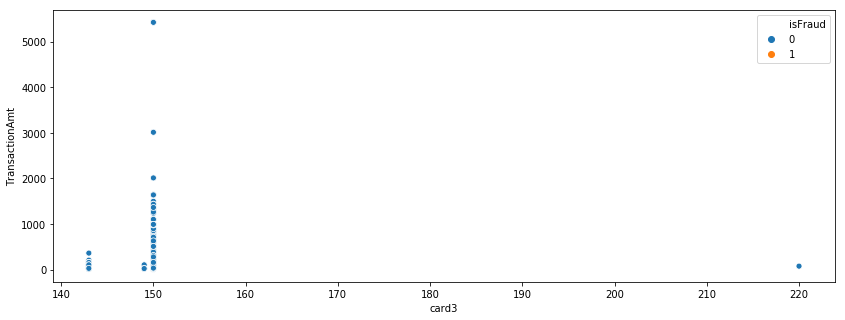

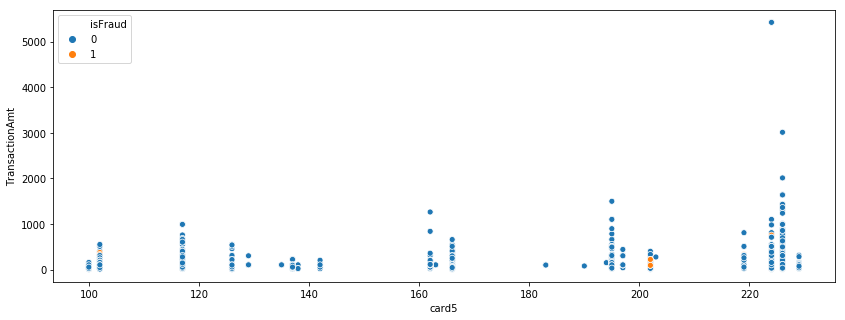

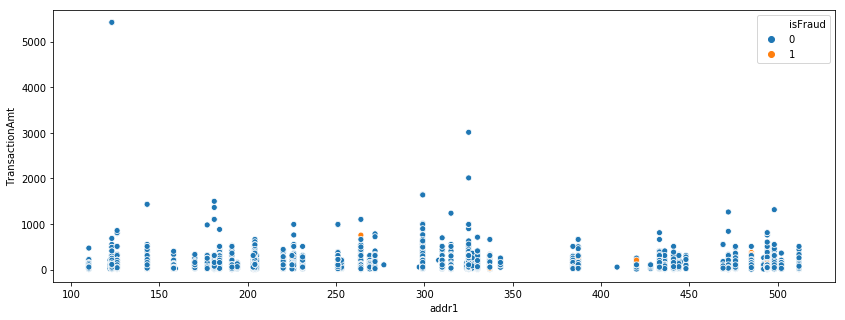

...

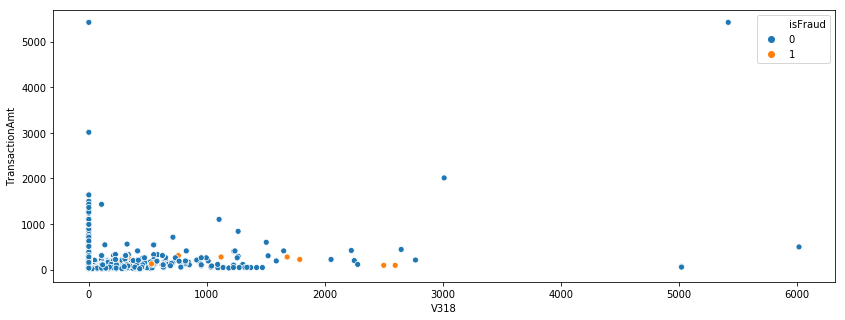

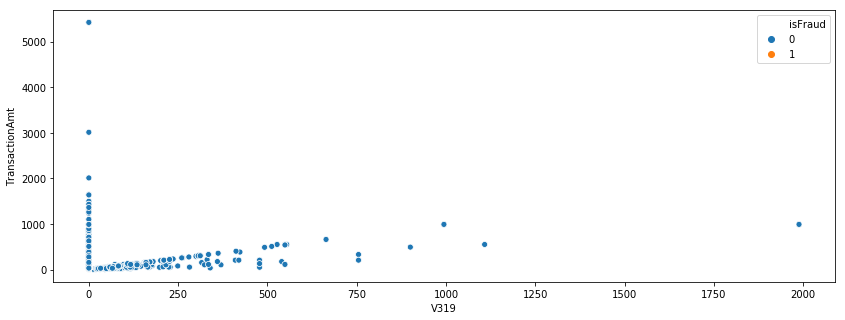

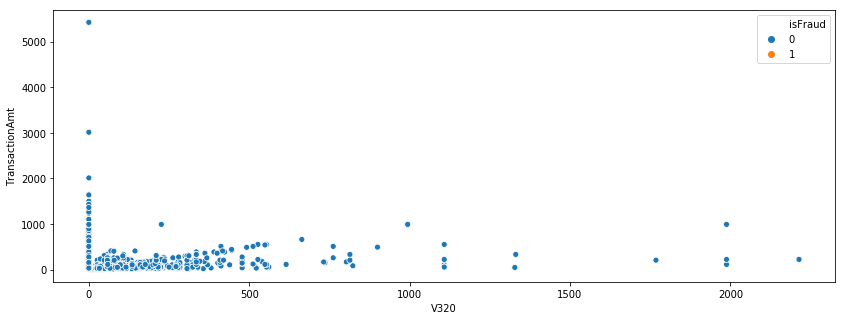

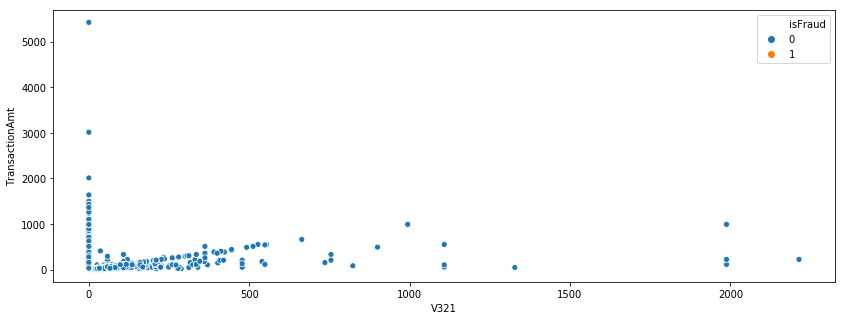

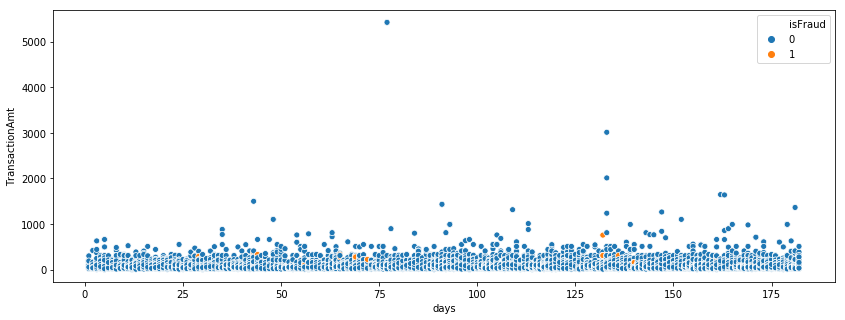

In [62]:
for col in numerical_columns[4:]:
    fig,ax=plt.subplots(figsize=(14,5))
    sns.scatterplot(col,"TransactionAmt",data=df[df.C2>20],hue="isFraud",ax=ax)
    plt.show()

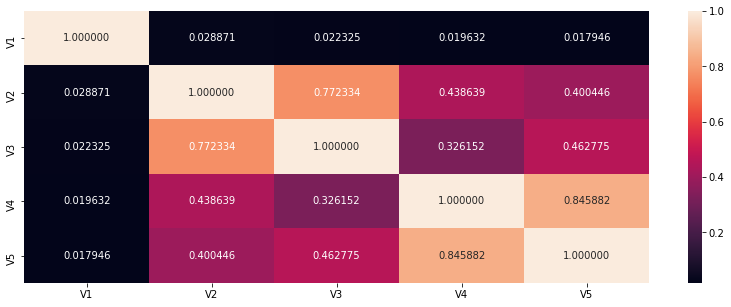

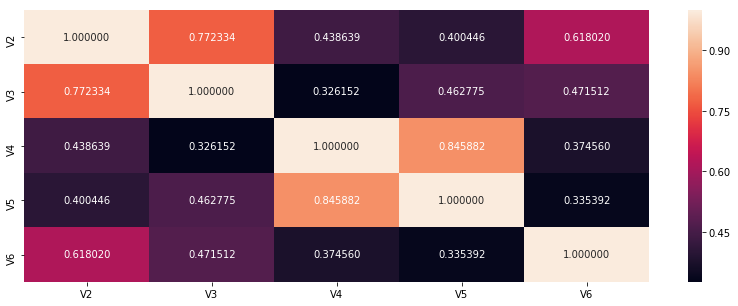

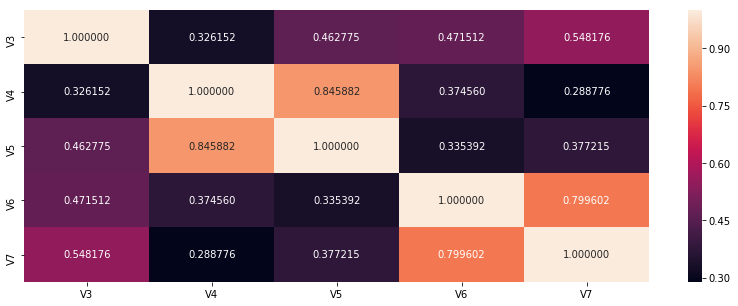

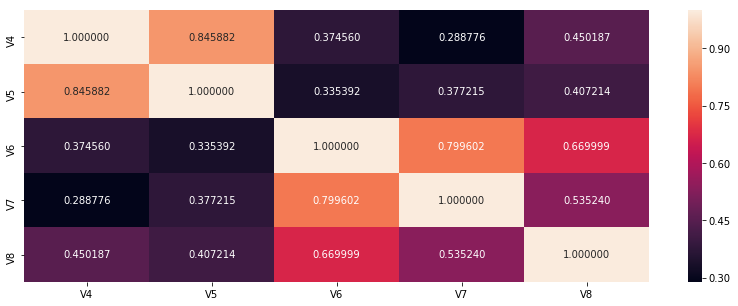

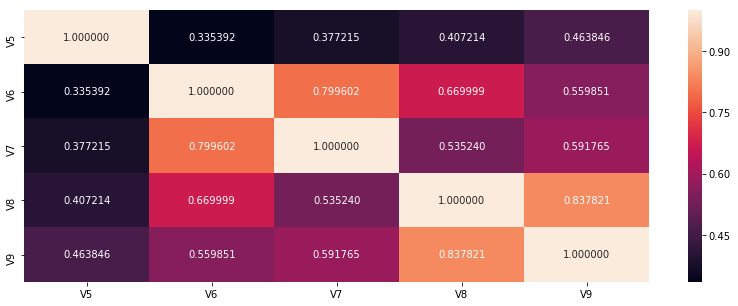

...

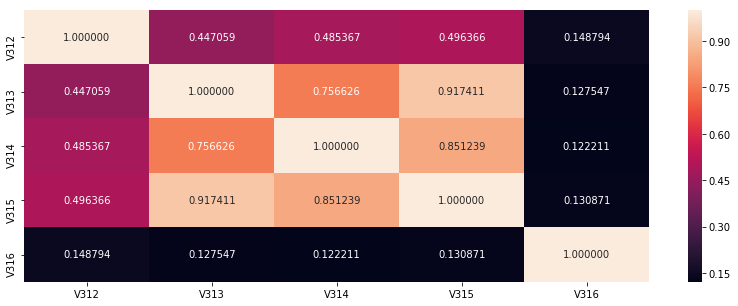

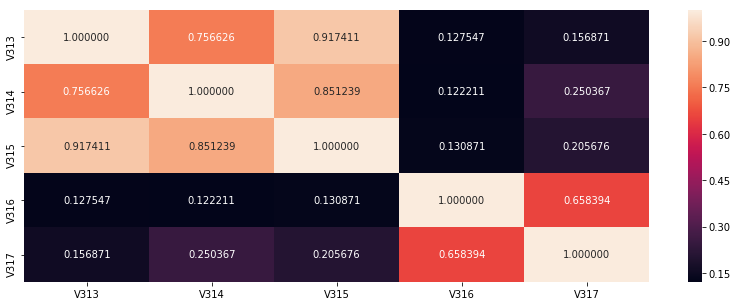

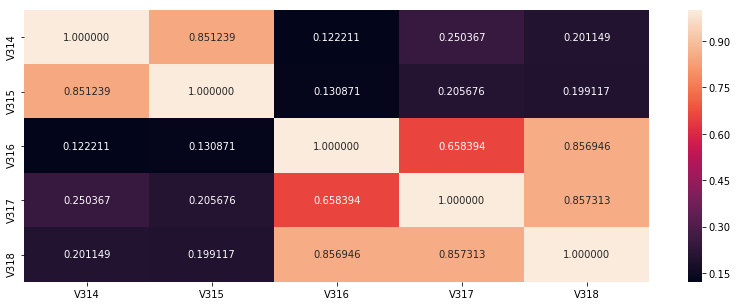

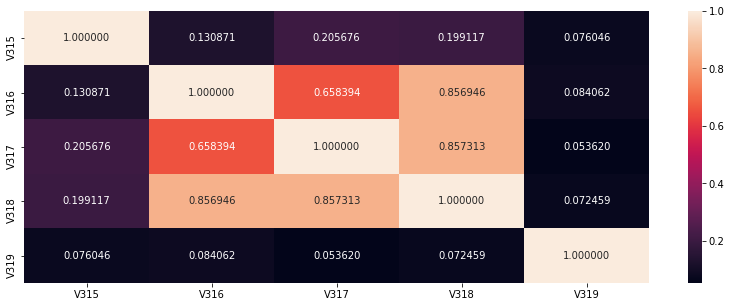

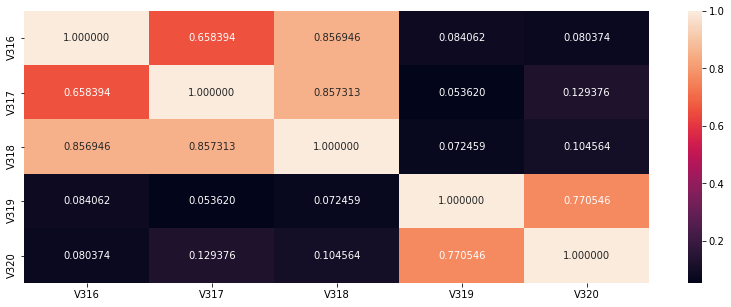

In [63]:
for i in range(0,len(df.columns[df.columns.str.startswith("V")])):
    if(i+5==(len(df.columns[df.columns.str.startswith("V")]))):
        break
    else:
        fig,ax=plt.subplots(figsize=(14,5))
        sns.heatmap(df[df.columns[df.columns.str.startswith("V")][i:i+5]].corr(),annot=True,fmt="f")
        plt.show()

In [64]:
#V3,V5,V7,V9,V11,V13,V19,V23,V25,V29,V33,V35,V37,V45,V47,V49,V51

In [65]:
#Highly correlated features
df.drop(columns=["V3","V5","V7","V9","V11","V13","V19","V23","V25","V29","V33","V35","V37","V45","V47","V49","V51"],inplace=True)

In [66]:
#Highly correlated features
df.drop(columns=["V2","V8","V53","V55","V61","V67","V69","V73","V75","V77","V83","V87","V91","V97","V99"],inplace=True)

In [67]:
#V2,V8,V53,V55,V61,V67,V69,V73,V75,V77,V83,V87,V91,V97,V99

In [68]:
df.drop(columns=["V95","V100","V96","V103","V105","V106","V110","V111","V113","V115","V116","V119","V120","V122","V125","V127","V128","V131","V133","V134","V136","V137","V280"],inplace=True)

In [69]:
#V114,V126,V282,V283,V286,V287,V289,V292,V295,V299,V301,V308,V310,V311,V314,V315,V318,V317,V320

In [70]:
df.drop(columns=["V114","V126","V282","V283","V286","V287","V289","V292","V295","V299","V301","V308","V310","V311","V314","V315","V318","V317","V320"],inplace=True)

In [73]:
#Highly correlated features
df.drop(columns=["V3","V5","V7","V9","V11","V13","V19","V23","V25","V29","V33","V35","V37","V45","V47","V49","V51"],inplace=True)

In [74]:
df.drop(columns=["V107","V279","V297","V307","V309"],inplace=True)

In [75]:
df.drop(columns=["V296","V306"],inplace=True)

In [76]:
df.drop(columns=["V30","V34","V48","V52","V70","V74"],inplace=True)

In [77]:
df.drop(columns=["V36","V86","V88"],inplace=True)

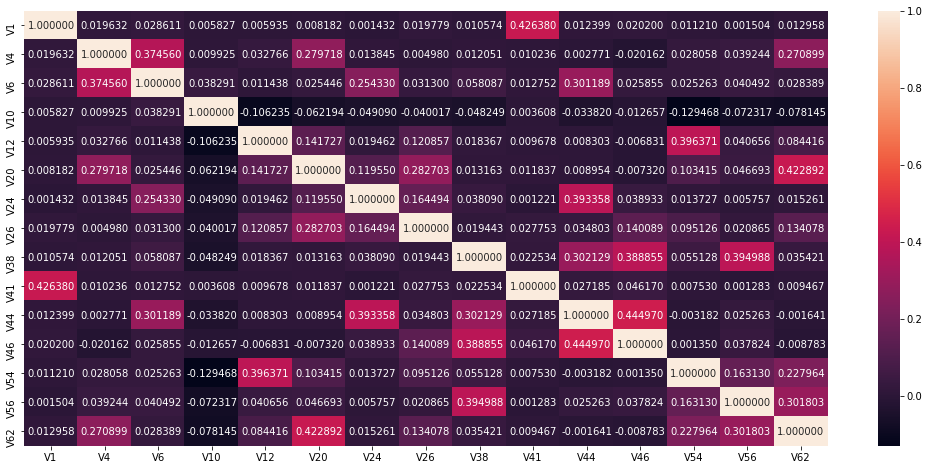

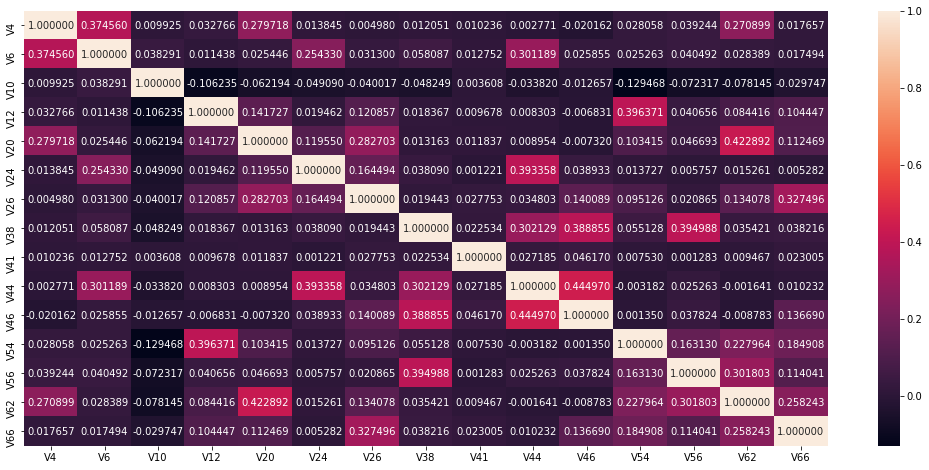

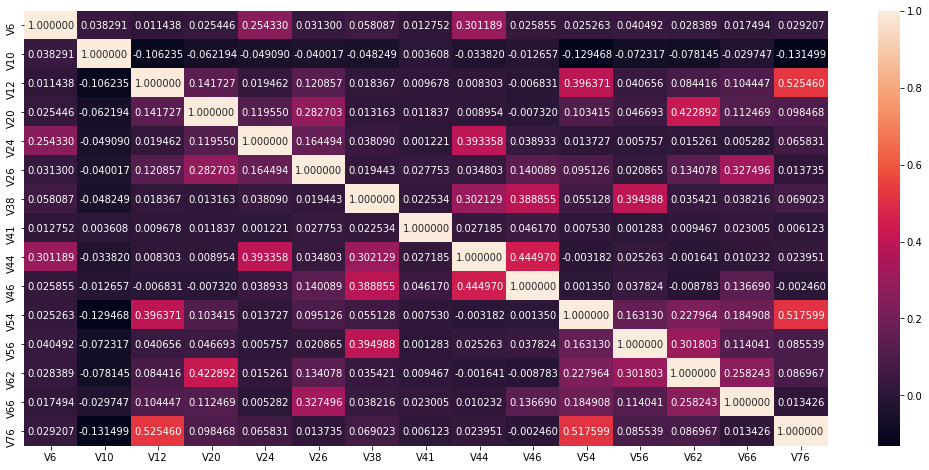

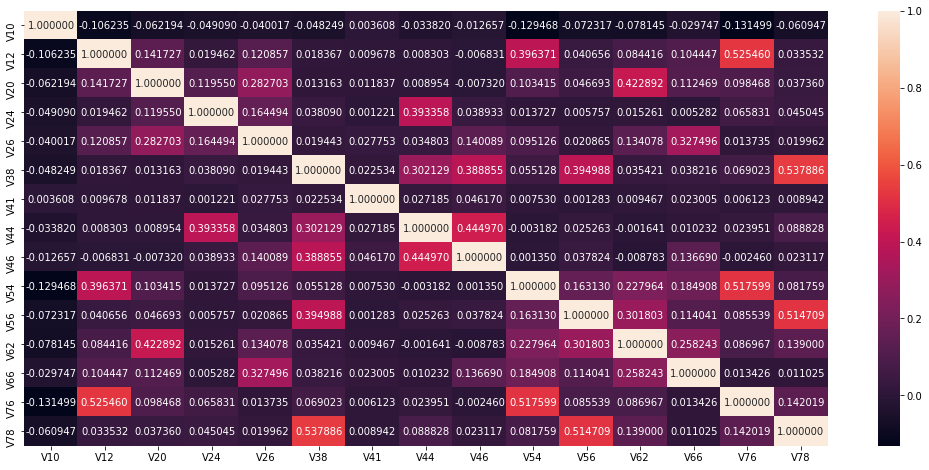

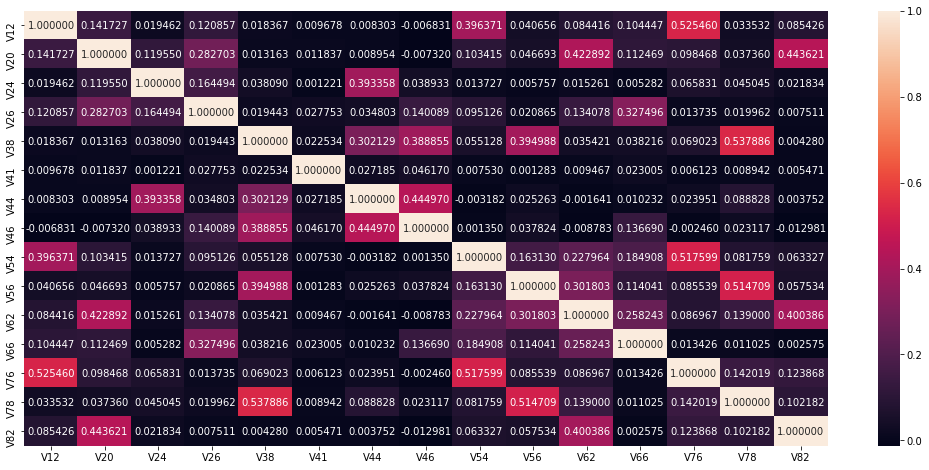

...

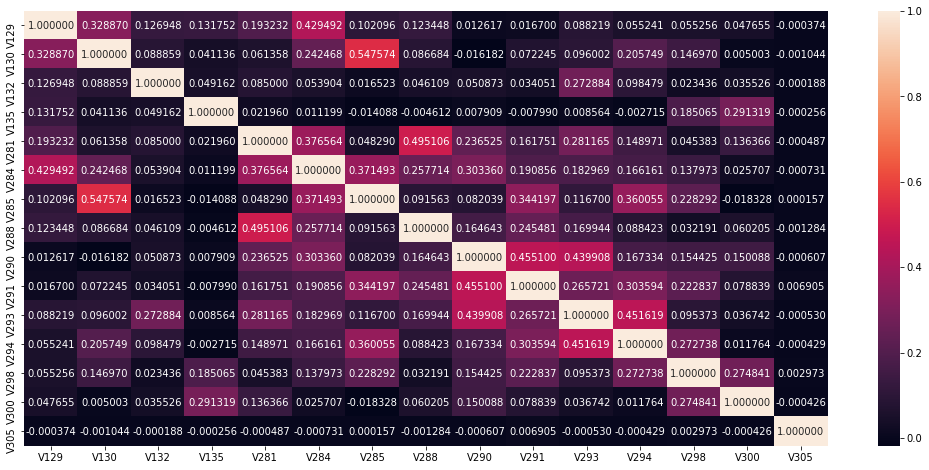

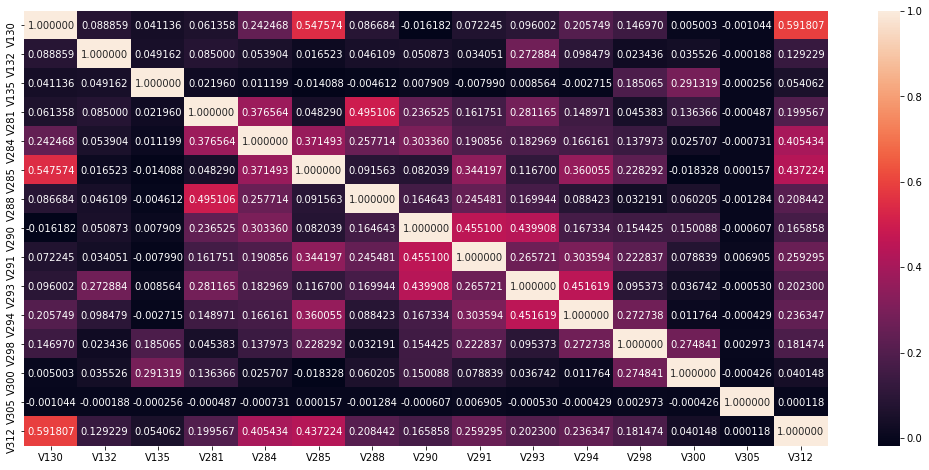

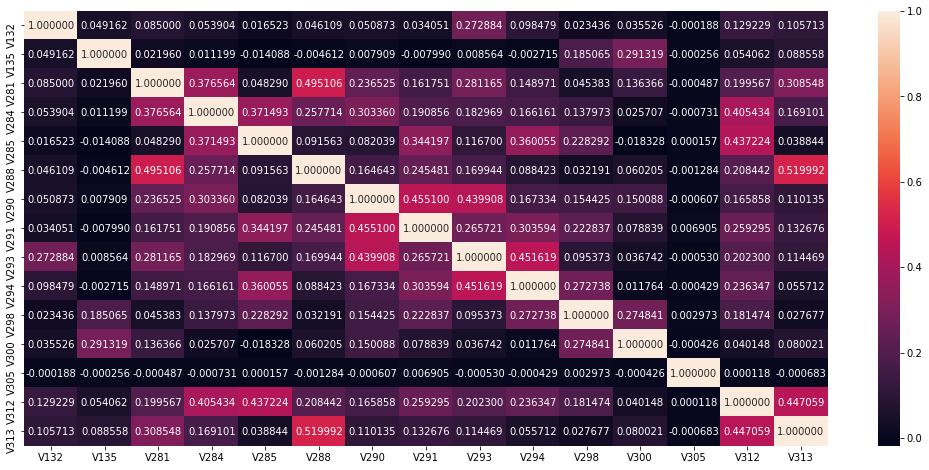

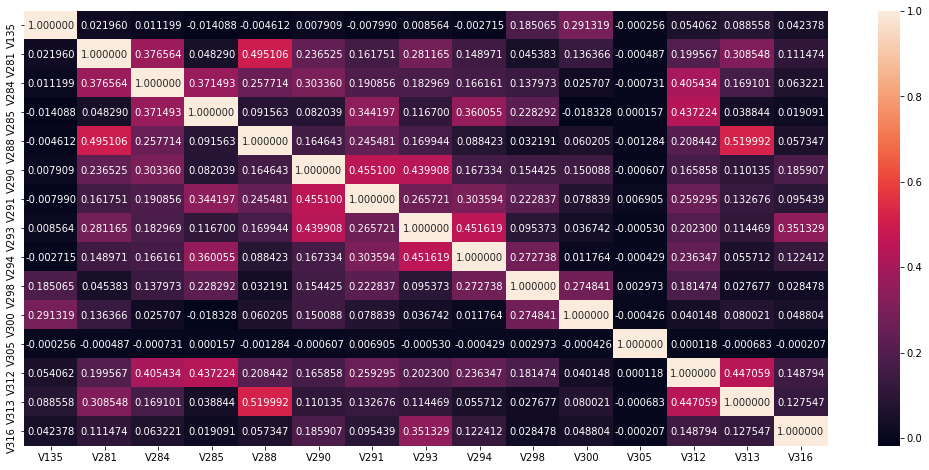

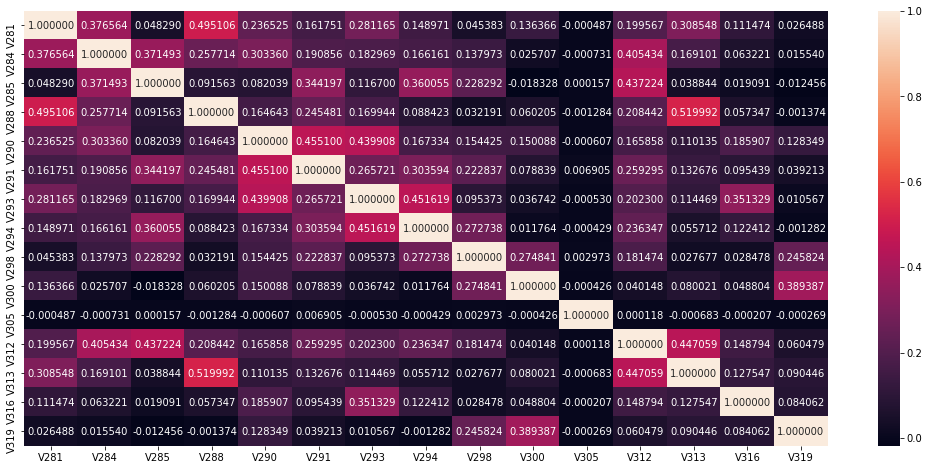

In [78]:
k=15
for i in range(0,len(df.columns[df.columns.str.startswith("V")])):
    if(i+k==(len(df.columns[df.columns.str.startswith("V")]))):
        break
    else:
        fig,ax=plt.subplots(figsize=(18,8))
        sns.heatmap(df[df.columns[df.columns.str.startswith("V")][i:i+k]].corr(),annot=True,fmt="f")
        plt.show()

In [79]:
categorical_columns=df.select_dtypes(include="object").columns.tolist()

In [80]:
missing_value_dict={}
for col in df.columns[2:]:
    if col in categorical_columns:
        missing_value_dict[col]=df[col].mode()
    else:
        missing_value_dict[col]=df[col].median()

In [81]:
%%time
identity_test=pd.read_csv("test_identity.csv")
transaction_test=pd.read_csv("test_transaction.csv")

Wall time: 44.4 s


In [82]:
df_test=transaction_test.merge(identity_test,copy=True,how="left",on="TransactionID")

In [83]:
df_test["days"]=df_test.TransactionDT.map(lambda x: floor(x/(3600*24)))

In [84]:
df_test["isFraud"]=0

In [85]:
df_test=df_test[df.columns].copy()

In [86]:
%%time
for col in df_test.columns:
    if(df_test[col].isnull().sum()>0):
        df_test[col].fillna(missing_value_dict[col],inplace=True)
    else:
        continue

Wall time: 1.25 s


In [87]:
df_test.card4.fillna(str(missing_value_dict["card4"]),inplace=True)
df_test.card6.fillna(str(missing_value_dict["card6"]),inplace=True)
df_test.P_emaildomain.fillna(str(missing_value_dict["P_emaildomain"]),inplace=True)

In [88]:
df_test.columns[df_test.isnull().any()]

Index([], dtype='object')

In [89]:
from sklearn.cluster import KMeans
from sklearn.datasets import make_blobs
from sklearn.preprocessing import StandardScaler,LabelEncoder
from sklearn.model_selection import train_test_split

In [90]:
le=LabelEncoder()

In [92]:
%%time
for col in categorical_columns:
    le.fit(list(set(df_test[col].unique()).union(set(df[col].unique()))))
    df[col]=le.transform(df[col])
    df_test[col]=le.transform(df_test[col])

Wall time: 3.72 s


In [93]:
X=df.iloc[:,3:]
y=df.iloc[:,1]

In [94]:
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.3,random_state=42)

In [95]:
from sklearn.metrics import accuracy_score,recall_score,precision_recall_curve,precision_score,auc,roc_auc_score,roc_curve,confusion_matrix
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier,AdaBoostClassifier,BaggingClassifier,GradientBoostingClassifier,VotingClassifier

C:\Users\gandh\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:29: DeprecationWarning: numpy.core.umath_tests is an internal NumPy module and should not be imported. It will be removed in a future NumPy release.
  from numpy.core.umath_tests import inner1d


In [96]:
logreg=LogisticRegression(C=1.0,max_iter=180,penalty="l1",random_state=42,verbose=True)

In [97]:
%%time
model=logreg.fit(X_train,y_train)

[LibLinear]Wall time: 53.1 s


In [98]:
predictions=logreg.predict(X_test)

In [99]:
confusion_matrix(y_test,predictions)

array([[73036,    37],
       [ 1422,    25]], dtype=int64)

In [100]:
dtree=DecisionTreeClassifier(max_depth=15,max_leaf_nodes=250,random_state=42)

In [101]:
model=dtree.fit(X_train,y_train)

In [105]:
from sklearn import tree
import graphviz

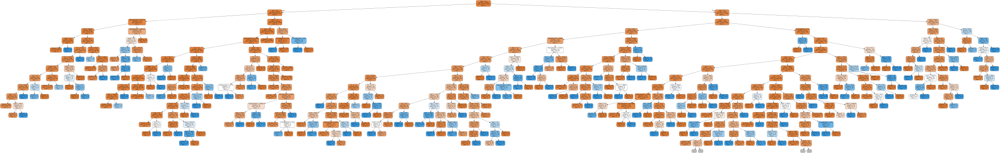

In [106]:
tree_graph = tree.export_graphviz(model, out_file=None, max_depth = 15,
    impurity = False, feature_names = X.columns, class_names = ['0', '1'],
    rounded = True, filled= True )
graphviz.Source(tree_graph)

In [107]:
predictions=dtree.predict(X_test)

In [108]:
confusion_matrix(y_test,predictions)

array([[72980,    93],
       [ 1129,   318]], dtype=int64)

In [109]:
rf=RandomForestClassifier(n_estimators=5,random_state=42,max_depth=15,max_leaf_nodes=100,n_jobs=5,max_features=0.8)

In [110]:
model=rf.fit(X_train,y_train)

In [111]:
predictions=model.predict(X_test)

In [112]:
confusion_matrix(y_test,predictions)

array([[73057,    16],
       [ 1252,   195]], dtype=int64)

In [113]:
gb=GradientBoostingClassifier(learning_rate=0.1,max_depth=10,max_leaf_nodes=80,n_estimators=100,random_state=42,verbose=True)

In [114]:
%%time
model=gb.fit(X_train,y_train)

      Iter       Train Loss   Remaining Time 
         1           0.1609            7.32m
         2           0.1520            7.20m
         3           0.1446            7.77m
         4           0.1402            7.76m
         5           0.1367            7.71m
         6           0.1337            7.51m
         7           0.1316            7.44m
         8           0.1292            7.38m
         9           0.1274            7.27m
        10           0.1246            7.23m
        20           0.1102            6.43m
        30           0.0985            5.52m
        40           0.0898            4.74m
        50           0.0836            4.00m
        60           0.0782            3.17m
        70           0.0736            2.36m
        80           0.0677            1.57m
        90           0.0642           46.67s
       100           0.0606            0.00s
Wall time: 7min 44s


In [115]:
predictions=model.predict(X_test)

In [116]:
confusion_matrix(y_test,predictions)

array([[72888,   185],
       [  933,   514]], dtype=int64)

In [117]:
submission=df_test[["TransactionID","isFraud"]].copy()

In [118]:
submission.loc[:,"isFraud"]=model.predict_proba(df_test[X.columns])[:,1]

In [119]:
submission.to_csv("submission_aug17.csv",index=False)